# Ticket to Ride
## Cezary Suchorski 160310

## **disclaimer**

The code that is shown in this notebook isn't necessarily the same code I use in the program when you normally run main.py. A lot of code present here implements the same logic, but with more debugging views returned, which weren't present in the original code. I made this decision because I found that integrating them now would disrupt the flow of normal execution of the pipeline. 

The code that is meant to be ran and I used to generate the result videos is in the main.py file + detectors/trackers directories. This notebook serves only a visualization purpose.

---

**Description:**  
Ticket to Ride is a board game where each player has a set of train cars and uses them to claim railway routes across the board (a map of some area of the world). The goal is to score as many points as possible by fulfilling destination cards and having the longest continuous track among all players.

---

## In-Game Items

- **Colored cards**: Players draw these to claim routes.  
- **Colored plastic train car pieces**: Physically placed on the board to claim a route.  
- **Board**: The map where players place their trains.  
- **Wooden markers**: Used to track each player's score.  
- **Plastic train station models**: Can be placed to use another player's track.  
- **Destination cards**: Quests to connect two specific locations on the map; give points when completed.

---

## Game Events (from Milestone 1)

- **Starting the game**: The board is empty; all players receive starting cards and destination cards.  
- **Ending the game**: Triggered when any player has 2 or fewer plastic trains after their turn (final round begins).  
- **Drawing a card**: Players draw colored cards to use for claiming routes.  
- **Building a train station**: Players place a station to utilize another player's route.  
- **Claiming a route**: Placing train pieces of a specific color on a selected route.  
- **Moving the score marker**: Adjusting the score tracker according to points gained.  
- **Drawing a new destination card**: Adding a new route goal to the player’s hand.

In the project I notify on the screen about drawing a new card and taking one off the board.

# Datasets

- EASY - top-down view with perfect light, the program worked very well on this one.

- MEDIUM - top-down view but a lot of moving shadows, worse recording quality because my phone struggled with less light, glare on the board/cards. More difficult for the program, the train detection struggled more here

- HARD - the moving shadows are more dynamic and unevenly spaced, perspective from an angle. The perspective shift didn't do much harm, the light (especially the glare) caused similar problems as in the MEDIUM.


# Ticket to Ride - Pipeline Demonstration
This notebook demonstrates how a single video frame is processed to detect and interpret game elements in *Ticket to Ride*.

Each step is visualized:
1. Original frame
2. Board detection
3. Perspective normalization
4. ROI separation (cards vs trains)
5. Train stack detection
6. Card detection

In [43]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


In [44]:
import sys
from pathlib import Path

project_root = Path().resolve().parents[0]
sys.path.append(str(project_root))

print("Project root:", project_root)


Project root: /home/cezary/PUT_sem5/CV/board_game_tracker


## Load one frame from each video

(np.float64(-0.5), np.float64(3239.5), np.float64(1919.5), np.float64(-0.5))

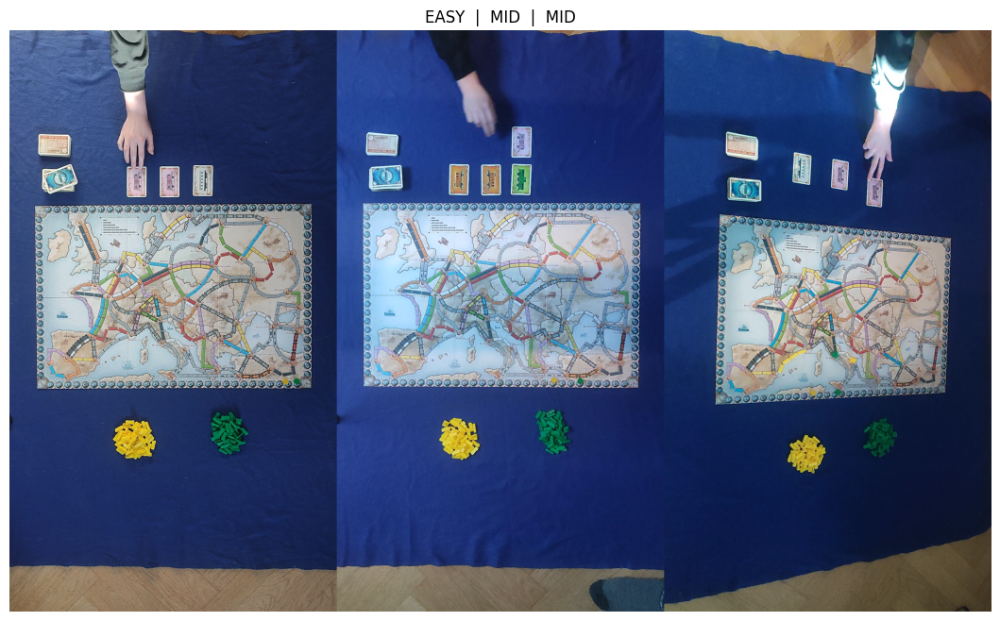

In [45]:

cap = cv2.VideoCapture('../data/HARD_3.mp4')
cap.set(cv2.CAP_PROP_POS_FRAMES, 600)
_, frame_hard = cap.read()
cap.release()

cap = cv2.VideoCapture('../data/MID_1.mp4')
cap.set(cv2.CAP_PROP_POS_FRAMES, 600)
_, frame_mid = cap.read()
cap.release()

cap = cv2.VideoCapture('../data/EASY_1.mp4')
cap.set(cv2.CAP_PROP_POS_FRAMES, 600)
_, frame_easy = cap.read()
cap.release()


frame_hard = cv2.rotate(frame_hard, cv2.ROTATE_90_CLOCKWISE)
frame_mid  = cv2.rotate(frame_mid,  cv2.ROTATE_90_COUNTERCLOCKWISE)
frame_easy = cv2.rotate(frame_easy, cv2.ROTATE_90_COUNTERCLOCKWISE)

h = min(frame_hard.shape[0], frame_mid.shape[0], frame_easy.shape[0])

def resize_h(img, h):
    return cv2.resize(img, (int(img.shape[1]*h/img.shape[0]), h))

frame_hard = resize_h(frame_hard, h)
frame_mid  = resize_h(frame_mid,  h)
frame_easy = resize_h(frame_easy, h)

stacked = np.hstack([frame_easy, frame_mid, frame_hard])

stacked_rgb = cv2.cvtColor(stacked, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(18,8))
plt.imshow(stacked_rgb)
plt.title("EASY  |  MID  |  MID")
plt.axis("off")


## Step 1 – Board Detection (detectors/board.py)

(np.float64(-0.5), np.float64(3239.5), np.float64(1919.5), np.float64(-0.5))

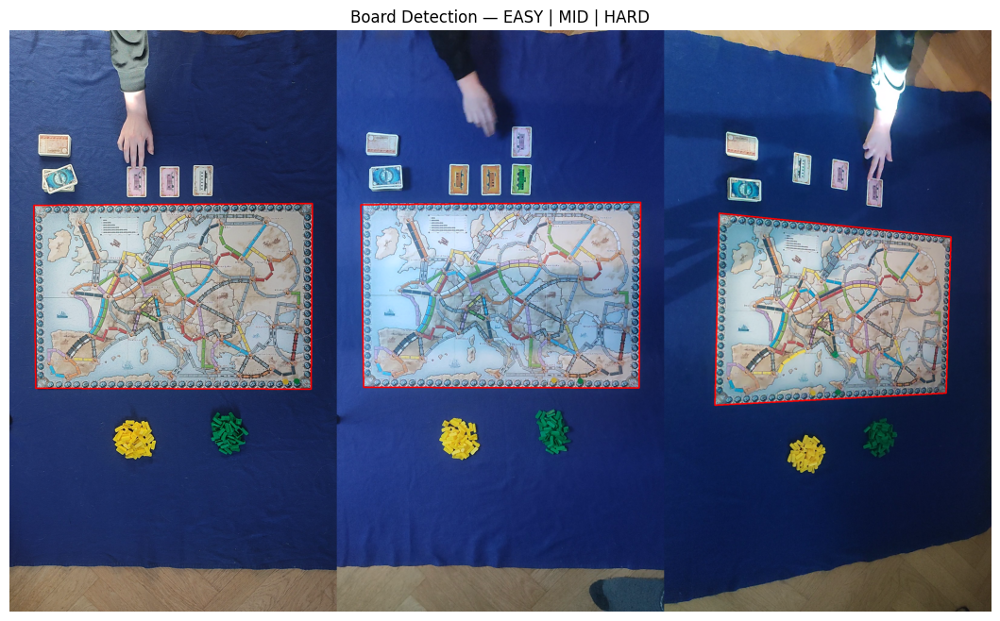

In [46]:
from detectors.board import detect_board_ctn
def draw_board(frame):
    corners, _ = detect_board_ctn(frame)
    out = frame.copy()
    if corners is not None:
        cv2.polylines(out, [corners.astype(int)], True, (0,0,255), 4)
    return out

# Apply detection
hard_board = draw_board(frame_hard)
mid_board  = draw_board(frame_mid)
easy_board = draw_board(frame_easy)

# Resize to same height
h = min(hard_board.shape[0], mid_board.shape[0], easy_board.shape[0])

def resize_h(img, h):
    return cv2.resize(img, (int(img.shape[1]*h/img.shape[0]), h))

hard_board = resize_h(hard_board, h)
mid_board  = resize_h(mid_board, h)
easy_board = resize_h(easy_board, h)

# Stack
stacked = np.hstack([easy_board, mid_board,hard_board])

# Convert to RGB
stacked_rgb = cv2.cvtColor(stacked, cv2.COLOR_BGR2RGB)

# Display
plt.figure(figsize=(18,8))
plt.imshow(stacked_rgb)
plt.title("Board Detection — EASY | MID | HARD")
plt.axis("off")


In [47]:
from detectors.board import sort_box_corners

def debug_detect_board(frame):
    out = {}

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    out["1_gray"] = gray

    blur = cv2.GaussianBlur(gray, (5,5), 0)
    out["2_blur"] = blur

    thresh = cv2.adaptiveThreshold(
        blur, 255,
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY_INV,
        31, 10
    )
    out["3_thresh"] = thresh

    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5,5))
    closed = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)
    out["4_closed"] = closed

    contours,_ = cv2.findContours(closed, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    vis = cv2.cvtColor(closed, cv2.COLOR_GRAY2BGR)

    if contours:
        cnt = max(contours, key=cv2.contourArea)
        epsilon = 0.02 * cv2.arcLength(cnt, True)
        approx = cv2.approxPolyDP(cnt, epsilon, True)

        if len(approx) == 4:
            corners = sort_box_corners(approx.reshape(4,2).astype(np.float32))
            cv2.drawContours(vis, [corners.astype(int)], -1, (0,255,0), 4)

        cv2.drawContours(vis, [cnt], -1, (0,0,255), 2)

    out["5_contours"] = vis
    return out


In [48]:
hard_steps = debug_detect_board(frame_hard)
mid_steps  = debug_detect_board(frame_mid)
easy_steps = debug_detect_board(frame_easy)


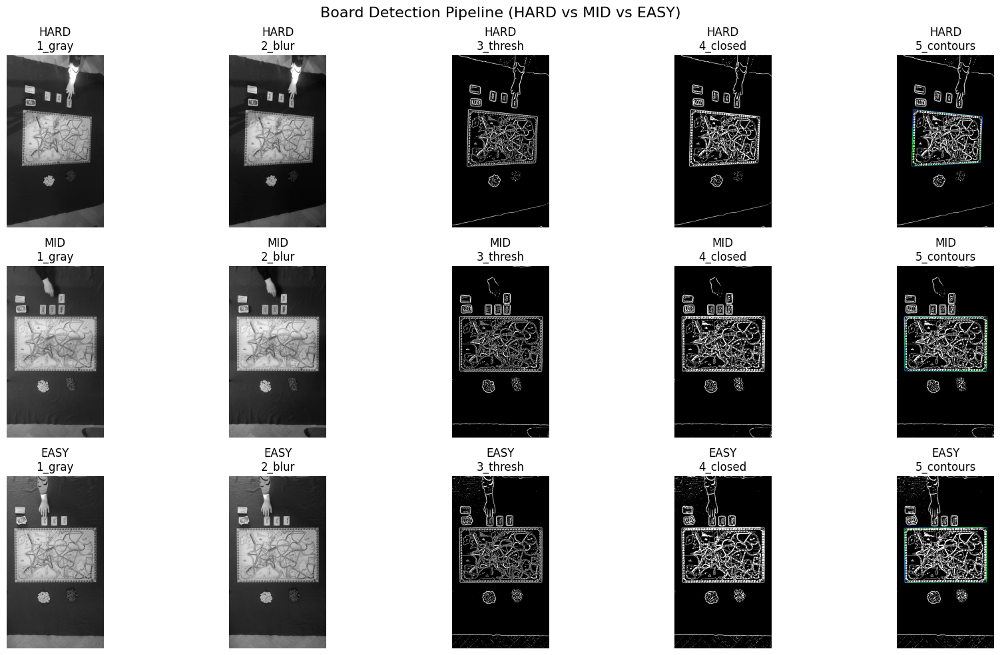

In [49]:
steps = ["1_gray","2_blur","3_thresh","4_closed","5_contours"]

fig, axes = plt.subplots(3, len(steps), figsize=(18,10))

for col, step in enumerate(steps):
    axes[0,col].imshow(hard_steps[step], cmap='gray')
    axes[0,col].set_title(f"HARD\n{step}")

    axes[1,col].imshow(mid_steps[step], cmap='gray')
    axes[1,col].set_title(f"MID\n{step}")

    axes[2,col].imshow(easy_steps[step], cmap='gray')
    axes[2,col].set_title(f"EASY\n{step}")

for ax in axes.flat:
    ax.axis("off")

plt.suptitle("Board Detection Pipeline (HARD vs MID vs EASY)", fontsize=16)
plt.tight_layout()
plt.show()


## Step 2 – Perspective Normalization (main.py)

(np.float64(-0.5), np.float64(1799.5), np.float64(399.5), np.float64(-0.5))

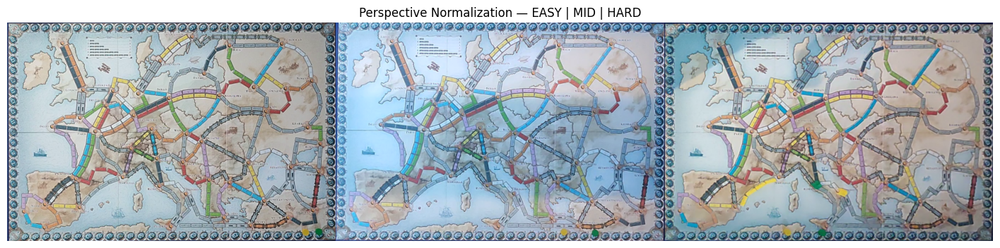

In [50]:
from detectors.board import detect_board_ctn

BOARD_W, BOARD_H = 1200, 800
dst = np.array([[0,0],[BOARD_W,0],[BOARD_W,BOARD_H],[0,BOARD_H]], dtype=np.float32)

def warp_board(frame):
    corners, _ = detect_board_ctn(frame)
    if corners is None:
        return None
    H = cv2.getPerspectiveTransform(corners.astype(np.float32), dst)
    warped = cv2.warpPerspective(frame, H, (BOARD_W, BOARD_H))
    return warped

# Warp all three
hard_warp = warp_board(frame_hard)
mid_warp  = warp_board(frame_mid)
easy_warp = warp_board(frame_easy)

# Resize for display
def resize_w(img, w=600):
    h = int(img.shape[0] * w / img.shape[1])
    return cv2.resize(img, (w, h))

hard_warp = resize_w(hard_warp)
mid_warp  = resize_w(mid_warp)
easy_warp = resize_w(easy_warp)

# Stack
stacked = np.hstack([easy_warp, mid_warp, hard_warp])
stacked_rgb = cv2.cvtColor(stacked, cv2.COLOR_BGR2RGB)

# Show
plt.figure(figsize=(18,7))
plt.imshow(stacked_rgb)
plt.title("Perspective Normalization — EASY | MID | HARD")
plt.axis("off")


## Step 3 – Table Alignment and ROI Extraction (main.py, utils.py -> get_aligned_frame())

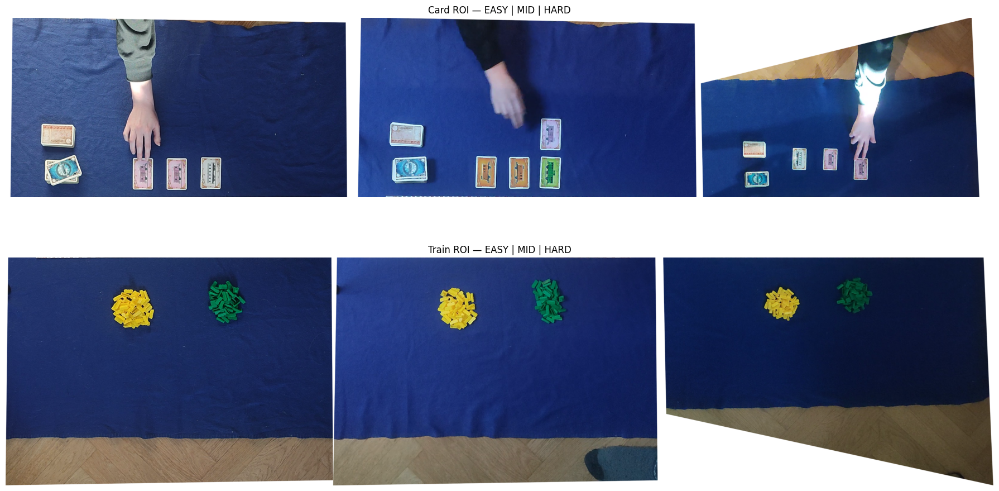

In [51]:
from utils import get_aligned_frame
from detectors.board import detect_board_ctn

def extract_rois(frame):
    corners, _ = detect_board_ctn(frame)
    if corners is None:
        return None, None
    BOARD_W, BOARD_H = 1200, 800
    dst = np.array([[0,0],[BOARD_W,0],[BOARD_W,BOARD_H],[0,BOARD_H]], dtype=np.float32)
    H = cv2.getPerspectiveTransform(corners.astype(np.float32), dst)
    table_view, H_final = get_aligned_frame(frame, H)
    
    # Transform corners to table_view coordinates
    board_corners_h = corners.reshape(-1,1,2)
    table_corners = cv2.perspectiveTransform(board_corners_h, H_final).reshape(4,2)
    
    y_min = int(table_corners[:,1].min())
    y_max = int(table_corners[:,1].max())
    
    card_ROI  = table_view[0:y_min, :]
    train_ROI = table_view[y_max:, :]
    return card_ROI, train_ROI

# Extract ROIs for all difficulty levels
hard_card, hard_train = extract_rois(frame_hard)
mid_card, mid_train   = extract_rois(frame_mid)
easy_card, easy_train = extract_rois(frame_easy)

# Resize to same height for horizontal stacking
def resize_h(img, h):
    return cv2.resize(img, (int(img.shape[1]*h/img.shape[0]), h))

h_card = min(hard_card.shape[0], mid_card.shape[0], easy_card.shape[0])
h_train = min(hard_train.shape[0], mid_train.shape[0], easy_train.shape[0])

hard_card = resize_h(hard_card, h_card)
mid_card  = resize_h(mid_card, h_card)
easy_card = resize_h(easy_card, h_card)

hard_train = resize_h(hard_train, h_train)
mid_train  = resize_h(mid_train, h_train)
easy_train = resize_h(easy_train, h_train)

# Stack horizontally
cards_stacked  = np.hstack([easy_card, mid_card, hard_card])
trains_stacked = np.hstack([easy_train, mid_train, hard_train])

# Convert to RGB
cards_rgb  = cv2.cvtColor(cards_stacked, cv2.COLOR_BGR2RGB)
trains_rgb = cv2.cvtColor(trains_stacked, cv2.COLOR_BGR2RGB)

# Show
fig, axs = plt.subplots(2,1, figsize=(18,10))
axs[0].imshow(cards_rgb)
axs[0].set_title("Card ROI — EASY | MID | HARD")
axs[1].imshow(trains_rgb)
axs[1].set_title("Train ROI — EASY | MID | HARD")

for ax in axs:
    ax.axis("off")

plt.tight_layout()
plt.show()


## Step 4 – Train Stack Detection (detectors/trains.py)

In [52]:
from detectors.trains import get_dominant_color


def debug_train_stacks(roi, min_area=5000, max_area=60000, max_aspect_ratio=2.0):
    """
    Detect train stacks in ROI, show intermediate steps, and compute dominant color.
    Returns dict of images for each processing step, plus stack info with color.
    """
    steps = {}
    
    h, w = roi.shape[:2]
    crop_y = int(h * 0.60)
    roi_cropped = roi[:crop_y, :]
    
    # Step 1: Grayscale
    roi_gray = cv2.cvtColor(roi_cropped, cv2.COLOR_BGR2GRAY)
    steps['gray'] = roi_gray
    
    # Step 2: Blur
    roi_blur = cv2.GaussianBlur(roi_gray, (5,5), 0)
    steps['blur'] = roi_blur
    
    # Step 3: Adaptive threshold
    thresh = cv2.adaptiveThreshold(roi_blur, 255, cv2.ADAPTIVE_THRESH_MEAN_C,
                                   cv2.THRESH_BINARY_INV, 31, 5)
    steps['thresh'] = thresh
    
    # Step 4: Morphology close
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
    closed = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel=kernel, iterations=5)
    steps['closed'] = closed
    
    # Step 5: Find contours and filter
    contours, _ = cv2.findContours(closed, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    vis = cv2.cvtColor(roi_gray, cv2.COLOR_GRAY2BGR)
    stack_info = []
    
    for i, cnt in enumerate(contours):
        area = cv2.contourArea(cnt)
        if area < min_area or area > max_area:
            continue
        x,y,w_box,h_box = cv2.boundingRect(cnt)
        if w_box > max_aspect_ratio*h_box or h_box > max_aspect_ratio*w_box:
            continue
        
        # Smooth contour
        epsilon = 0.002 * cv2.arcLength(cnt, True)
        cnt = cv2.approxPolyDP(cnt, epsilon, True)
        
        # Compute center
        M = cv2.moments(cnt)
        if M["m00"] == 0:
            continue
        cx = int(M["m10"]/M["m00"])
        cy = int(M["m01"]/M["m00"])
        center = np.array([cx,cy])
        
        # --- Compute dominant color ---
        color_hsv = get_dominant_color(roi_cropped, cnt)
        
        # Save stack info
        stack_info.append({'cnt': cnt, 'center': center, 'color': color_hsv})
        
        # Draw stack on visualization
        cv2.drawContours(vis, [cnt], -1, (255,0,255), 2)
        cv2.rectangle(vis, (x,y), (x+w_box, y+h_box), (0,255,0), 2)
        cv2.putText(vis, f"ID {len(stack_info)}", (x+5,y+20), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,0,0), 2)
    
    steps['stacks'] = vis
    steps['stack_info'] = stack_info
    
    return steps


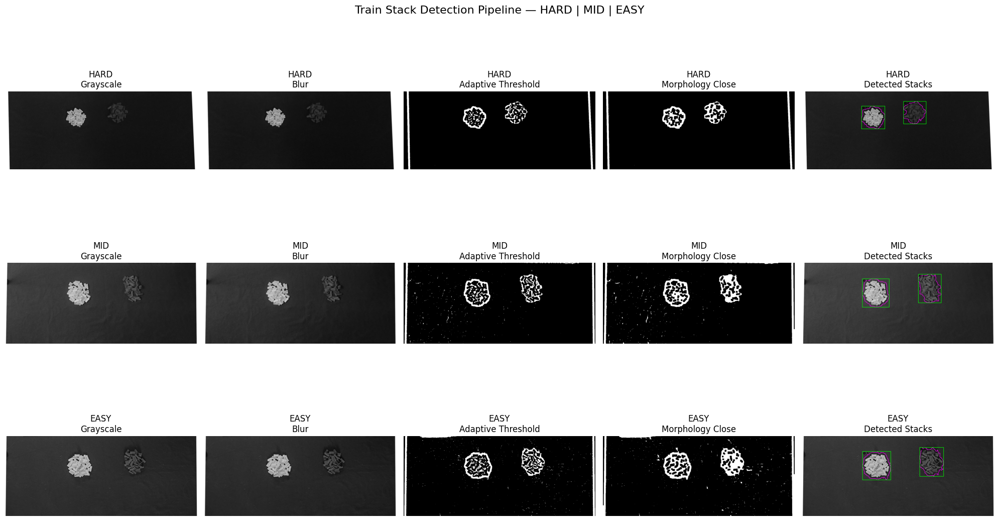

In [53]:
hard_train_steps = debug_train_stacks(hard_train)
mid_train_steps  = debug_train_stacks(mid_train)
easy_train_steps = debug_train_stacks(easy_train)

step_order = ['gray','blur','thresh','closed','stacks']
titles = ['Grayscale','Blur','Adaptive Threshold','Morphology Close','Detected Stacks']

fig, axs = plt.subplots(3, len(step_order), figsize=(20,12))

for col, step in enumerate(step_order):
    axs[0,col].imshow(hard_train_steps[step], cmap='gray' if step!='stacks' else None)
    axs[0,col].set_title(f"HARD\n{titles[col]}")
    
    axs[1,col].imshow(mid_train_steps[step], cmap='gray' if step!='stacks' else None)
    axs[1,col].set_title(f"MID\n{titles[col]}")
    
    axs[2,col].imshow(easy_train_steps[step], cmap='gray' if step!='stacks' else None)
    axs[2,col].set_title(f"EASY\n{titles[col]}")

for ax in axs.flat:
    ax.axis('off')
plt.suptitle("Train Stack Detection Pipeline — HARD | MID | EASY", fontsize=16)
plt.tight_layout()
plt.show()


## Step 5 – Card Detection (detectors/cards.py)

In [54]:
from skimage.exposure import rescale_intensity

def debug_detect_cards(frame):
    steps = {}

    # Step 1: Intensity rescale
    frame_rescale = np.uint8(rescale_intensity(frame, out_range=(0, 255)))
    steps['rescale'] = frame_rescale

    # Step 2: Grayscale
    frame_gray = cv2.cvtColor(frame_rescale, cv2.COLOR_BGR2GRAY)
    steps['gray'] = frame_gray

    # Step 3: Blur
    frame_blurred = cv2.medianBlur(frame_gray, 5)
    steps['blur'] = frame_blurred

    # Step 4: Adaptive threshold
    frame_thresh = cv2.adaptiveThreshold(
        frame_blurred, 255,
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY_INV,
        11, 10)
    steps['thresh'] = frame_thresh

    # Step 5: Morphology close
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5,5))
    frame_closed = cv2.morphologyEx(frame_thresh, cv2.MORPH_CLOSE, kernel)
    steps['closed'] = frame_closed

    # Step 6: Contour detection & filtering
    contours, _ = cv2.findContours(frame_closed, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    overlay = cv2.cvtColor(frame_gray, cv2.COLOR_GRAY2BGR)

    for cnt in contours:
        area = cv2.contourArea(cnt)
        if area < 5000 or area > 50000:
            continue
        x, y, w, h = cv2.boundingRect(cnt)
        if w*h > 25000:
            continue
        cv2.rectangle(overlay, (x,y), (x+w, y+h), (0,255,0), 2)

    steps['detected'] = overlay
    return steps


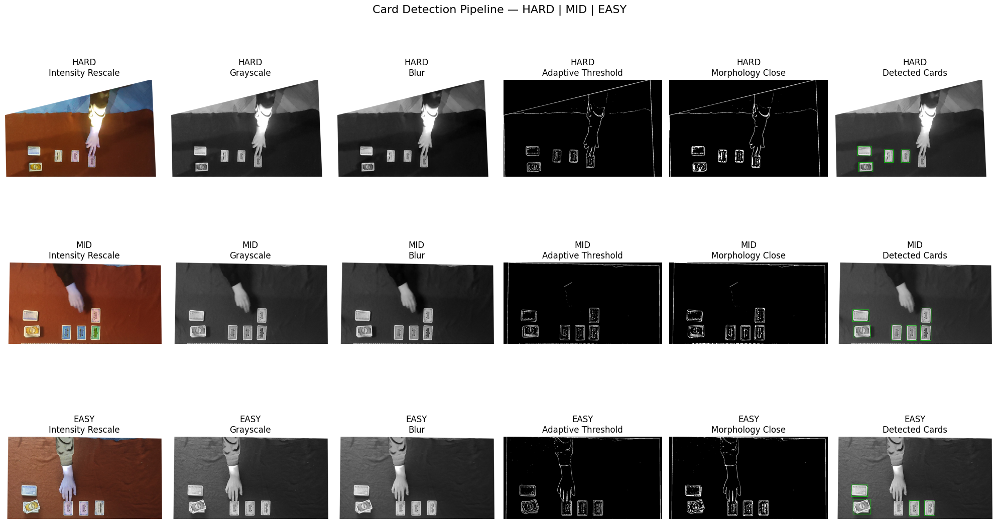

In [55]:
hard_card_steps = debug_detect_cards(hard_card)
mid_card_steps  = debug_detect_cards(mid_card)
easy_card_steps = debug_detect_cards(easy_card)

import matplotlib.pyplot as plt

step_order = ['rescale','gray','blur','thresh','closed','detected']
titles = ['Intensity Rescale','Grayscale','Blur','Adaptive Threshold','Morphology Close','Detected Cards']

fig, axs = plt.subplots(3, len(step_order), figsize=(20,12))

for col, step in enumerate(step_order):
    axs[0,col].imshow(hard_card_steps[step], cmap='gray' if step!='detected' else None)
    axs[0,col].set_title(f"HARD\n{titles[col]}")

    axs[1,col].imshow(mid_card_steps[step], cmap='gray' if step!='detected' else None)
    axs[1,col].set_title(f"MID\n{titles[col]}")

    axs[2,col].imshow(easy_card_steps[step], cmap='gray' if step!='detected' else None)
    axs[2,col].set_title(f"EASY\n{titles[col]}")

for ax in axs.flat:
    ax.axis('off')

plt.suptitle("Card Detection Pipeline — HARD | MID | EASY", fontsize=16)
plt.tight_layout()
plt.show()


## Coloring player pieces on the board (trains.py)


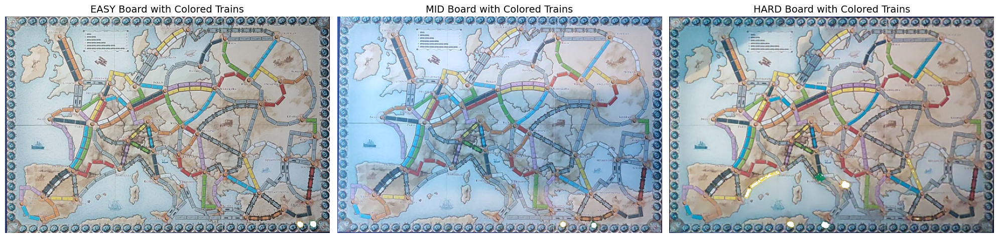

In [56]:
def visualize_train_colors_on_board(board_view, train_stacks, h_margin=15, s_margin=50, v_margin=50):
    board_colored = board_view.copy()
    dominant_colors = [s['color'] for s in train_stacks]
    hsv = cv2.cvtColor(board_colored, cv2.COLOR_BGR2HSV)
    
    for color in dominant_colors:
        lower = np.clip(color - np.array([h_margin,s_margin,v_margin]), [0,0,0], [179,255,255])
        upper = np.clip(color + np.array([h_margin,s_margin,v_margin]), [0,0,0], [179,255,255])
        mask = cv2.inRange(hsv, lower.astype(np.uint8), upper.astype(np.uint8))
        color_bgr = (255,255,255)
        board_colored[mask==255] = color_bgr
    return board_colored

colored_boards = {
    "EASY": visualize_train_colors_on_board(easy_warp, easy_train_steps['stack_info']),
    "MID":  visualize_train_colors_on_board(mid_warp, mid_train_steps['stack_info']),
    "HARD": visualize_train_colors_on_board(hard_warp, hard_train_steps['stack_info'])
}

fig, axs = plt.subplots(1, 3, figsize=(20,8))

for ax, (level, board) in zip(axs, colored_boards.items()):
    ax.imshow(cv2.cvtColor(board, cv2.COLOR_BGR2RGB))
    ax.set_title(f"{level} Board with Colored Trains", fontsize=14)
    ax.axis('off')

plt.tight_layout()
plt.show()


## Results analysis and dataset discussion

The easy dataset worked perfectly, because the light was stable and optimal for detection. More problems appeared in the medium and hard recordings. 

They were pretty similar in difficulty for the program, because the warped angle in the hard video is completely negated by the perspective transform.

- The biggest problem came from the fact that the camera recording was a lot more noisy when it was darker. 
- Another big problem was the overexposition of some parts of the frames. It wasn't that big of a problem for the card/board detection, but it is the reason why the player pieces' detection on the board isn't stable. Some trains have so much glare/overexposition that they lose all color information and thus are lost to the detector.